## Final Project Submission

Please fill out:
* Student name: 
* Student pace: self paced / part time / full time
* Scheduled project review date/time: 
* Instructor name: 
* Blog post URL:


# House Sales

## Business Problem

Housing market investment recommendation

## Stakeholders
KC Real estates

In [1]:
# Your code here - remember to use markdown cells for comments as well!
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')

import datetime
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.model_selection import cross_val_score

from sklearn.pipeline import make_pipeline, Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.utils import shuffle
from sklearn.preprocessing import PolynomialFeatures

import statsmodels.api as sm

import scipy.stats as stats
from scipy.stats import norm


### Data Exploration

In [206]:
df = pd.read_csv('data/kc_house_data.csv')
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [207]:
#df.info()

In [208]:
# here we create a dictionary of columns with total missing values

temp = {}
for col in df.columns:
    temp[col] = df[col].isna().sum()
    
# Switch key-value pairs
col_na = {}
for k,v in temp.items():
    col_na[v] = k
sorted(col_na.items(), reverse=True)


[(3842, 'yr_renovated'), (2376, 'waterfront'), (63, 'view'), (0, 'sqft_lot15')]

In [209]:
print('No. of observations:', df.shape[0])
print('Data after dropping missing values:', df.dropna().shape[0])
print('% drop:', (df.shape[0] - df.dropna().shape[0])/df.shape[0])

No. of observations: 21597
Data after dropping missing values: 15762
% drop: 0.2701764133907487


There is about 27% of missing values. Instead of removing those columns, we will drop the rows with missing values as these columns might be important in predicting housing price


### Basic Preprocessing

In [210]:
# Some preprocessing 
# df.dropna(inplace=True)

# Create a new column year sold
df['yr_sold'] = pd.DatetimeIndex(df.date).year

# Here we convert column containing string to float datatype, also replace '?'
df['sqft_basement'] = df.sqft_basement.apply(lambda x: x.replace('?', '0')).astype(float)

df = df[df['bedrooms'] < 33]
df = df[df['sqft_living'] < 13540]


In [211]:
# categorical_cols = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 
#                     'condition', 'grade']

# numerical_cols = ['sqft_living', 'sqft_lot', 'sqft_above', 'sqft_basement',
#                   'yr_built', 'yr_renovated', 'zipcode', 'sqft_living15', 'sqft_lot15']

# # columns_to_drop = ['id', 'date', 'price'] #'lat', 'long'] # 'zipcode', 'sqft_lot']


In [212]:
imputer_num = SimpleImputer(missing_values=np.nan, strategy ='median')
imputer_cat = SimpleImputer(strategy ='most_frequent')

df['yr_renovated'] = imputer_num.fit_transform(df['yr_renovated'].to_numpy().reshape(-1,1))
df['waterfront'] = imputer_cat.fit_transform(df['waterfront'].to_numpy().reshape(-1,1))
df['view'] = imputer_cat.fit_transform(df['view'].to_numpy().reshape(-1,1))

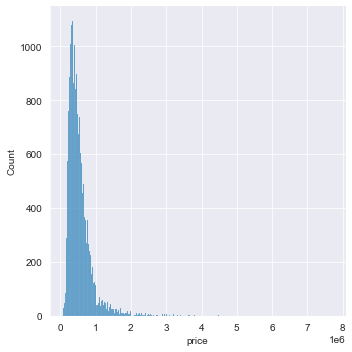

In [213]:
sns.displot(data=df, x = 'price');

In [214]:
df['price'] = np.log(df['price'])
# df['sqft_living'] = np.log(df['sqft_living'])

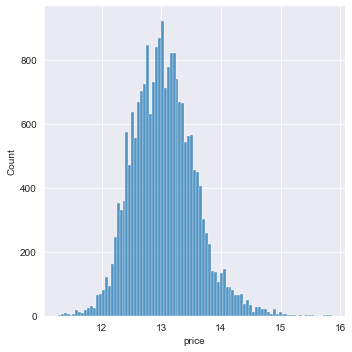

In [215]:
sns.displot(data=df, x = 'price');
# sns.displot(data=df, x = 'sqft_living');

In [8]:
# df.info()

In [5]:
# Prepare the data for training 

def create_train_test(df, columns_to_drop):
    
    X = df.drop(columns_to_drop, axis=1)
    y = df['price']

    # Create feature list for feature importance analysis after prediction
    features = list(X.columns)

    # # Shuffling for randomness
    X, y = shuffle(X, y, random_state=42)
    
    # Split into train-test set
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    return X_train, X_test, y_train, y_test, features

# **********************************************************
# # Scale the data: This will be included in the pipeline
# scaler = StandardScaler()
# scaler.fit(X_train)

# X_train = scaler.transform(X_train)
# X_test = scaler.transform(X_test)

In [6]:
def get_metrics(test, pred):
    print("Mean absolute error =", round(metrics.mean_absolute_error(test, pred), 2)) 
    print("Mean squared error =", round(metrics.mean_squared_error(test, pred), 2)) 
    print("Median absolute error =", round(metrics.median_absolute_error(test, pred), 2)) 
    print("Explain variance score =", round(metrics.explained_variance_score(test, pred), 2)) 
    print("R2 score =", round(metrics.r2_score(test, pred), 2))

In [53]:
X_train, X_test, y_train, y_test, features = create_train_test(df, columns_to_drop)

In [7]:
pipeline = make_pipeline(
    # Fill missing data,
    # impute,
    # one hote encoding,
    StandardScaler(),
    LinearRegression(),  
)

In [54]:
baseline_model = pipeline.fit(X_train, y_train)

# Predict response 
y_pred = pipeline.predict(X_test)

get_metrics(y_test, y_pred)


# Make a prediction with CV
scores = cross_val_score(baseline_model, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 125715.85
Mean squared error = 40004964034.45
Median absolute error = 89165.7
Explain variance score = 0.71
R2 score = 0.71

RMSE scores: [205766.61066495 196890.11345714 204050.98885613 206777.59859617
 193726.37345544]


In [55]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model = sm.OLS(y_train, X_int).fit()
stats_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.700
Model:                            OLS   Adj. R-squared:                  0.700
Method:                 Least Squares   F-statistic:                     2119.
Date:                Mon, 08 Mar 2021   Prob (F-statistic):               0.00
Time:                        18:51:49   Log-Likelihood:            -2.3544e+05
No. Observations:               17276   AIC:                         4.709e+05
Df Residuals:                   17256   BIC:                         4.711e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.396e+05   1526.874    353.396      0.000    5.37e+05    5.43e+05
x1         -3.558e+04   1989.693    -17.882      0.000   -3.95e+04   -3.17e+04
x2          3.023e+04   2791.255     10.831      0.000    2.48e+04    3.57e+04
x3          9.973e+04   1.98e+04      5.030      0.000    6.09e+04    1.39e+05
x4          6181.2548   2223.260      2.780      0.005    1823.440    1.05e+04
x5          5102.7020   2171.226      2.350      0.019     846.879    9358.525
x6          4.748e+04   1662.390     28.559      0.000    4.42e+04    5.07e+04
x7          4.055e+04   1809.063     22.415      0.000     3.7e+04    4.41e+04
x8          1.807e+04   1708.200     10.579      0.000    1.47e+04    2.14e+04
x9          1.111e+05   2827.868     39.271      0.000    1.06e+05    1.17e+05
x10         6.289e+04   1.79e+04      3.516      0.000    2.78e+04    9.79e+04
x11         2.242e+04   9409.795      2.382      0.017    3973.284    4.09e+04
x12        -7.673e+04   2365.995    -32.430      0.000   -8.14e+04   -7.21e+04
x13         1.028e+04   1615.906      6.362      0.000    7112.496    1.34e+04
x14        -3.156e+04   1964.451    -16.067      0.000   -3.54e+04   -2.77e+04
x15         8.389e+04   1657.052     50.626      0.000    8.06e+04    8.71e+04
x16        -3.066e+04   2053.131    -14.935      0.000   -3.47e+04   -2.66e+04
x17         1.562e+04   2633.920      5.929      0.000    1.05e+04    2.08e+04
x18        -1.021e+04   2244.371     -4.551      0.000   -1.46e+04   -5814.052
x19         1.492e+04   1531.645      9.739      0.000    1.19e+04    1.79e+04
==============================================================================
Omnibus:                    14578.083   Durbin-Watson:                   2.023
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1360891.021
Skew:                           3.545   Prob(JB):                         0.00
Kurtosis:                      45.899   Cond. No.                         42.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [15]:
# fig = plt.figure(figsize=(15,8))
# fig = sm.graphics.plot_regress_exog(stats_model, "x16", fig=fig)
# plt.show()

In [16]:
# import scipy.stats as stats
# residuals = stats_model.resid
# fig = sm.graphics.qqplot(residuals, dist=stats.norm, line='45', fit=True)
# fig.show()

In [28]:
def feature_importance(coefficients, features):
    '''
    Create feature comparison plots
    
    '''

    temp1 = dict(zip(features, coefficients))
    temp2 = dict(zip(features, abs(coefficients)))

    
    fig, ax = plt.subplots(1,2, figsize=(20,5))    
    
    ax[0].bar(range(len(temp1)), list(temp1.values()), align='center')
    ax[0].set_xticks(range(len(temp1))) 
    ax[0].set_xticklabels(labels = list(temp1.keys()), rotation='vertical', fontsize=16);    

    ax[1].bar(range(len(temp2)), list(temp2.values()), align='center')
    ax[1].set_xticks(range(len(temp2))) 
    ax[1].set_xticklabels(labels = list(temp2.keys()), rotation='vertical', fontsize=16);    


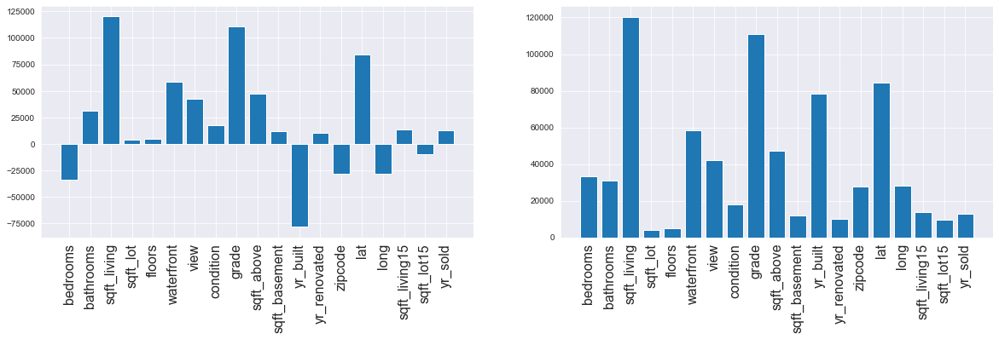

In [26]:
feature_importance(baseline_model[1].coef_, features)

### Checking Linear Regression assumptions

In [16]:
def test_linearity(model, x, y):
    '''
    Computes plots to inspect linearity assumptions for a linear regression
    Input is the stats model
    '''
    y_pred = pipeline.predict(x)

    fig, ax = plt.subplots(1,2)
    
    sns.regplot(x=y_pred, y=y, lowess=True, ax=ax[0], line_kws={'color': 'red'})
    ax[0].set_title('Observed vs. Predicted Values', fontsize=10)
    ax[0].set(xlabel='Predicted', ylabel='Observed')
 
    sns.regplot(x=y_pred, y=y-y_pred, lowess=True, ax=ax[1], line_kws={'color': 'red'})
    ax[1].set_title('Residuals vs. Predicted Values', fontsize=10)
    ax[1].set(xlabel='Predicted', ylabel='Residuals')
    
    plt.tight_layout();
    

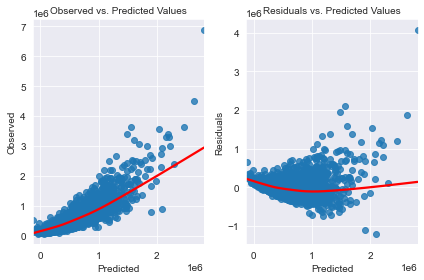

In [131]:
test_linearity(baseline_model, X_test, y_test)

The points should be symmetrically distributed around a diagonal line in the first and around a horizontal line the second plot. The 'bowed' pattern indicates that the model has made synthetic errors when making prediction. The second plot on the right also indicates the model suffers from 'heteroscedasticity'.

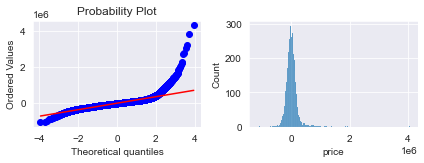

In [145]:
# Normality test
ax1 = plt.subplot(221)
res = stats.probplot(stats_model.resid, plot=plt)
ax2 = plt.subplot(222)

sns.histplot(y_test - y_pred)
plt.tight_layout()
plt.show();

Although, the histogram of the Residual looks somewhat Normal, the q-q plot indicates non-normal distribution. What can we do about it?

Although, the histogram of the Residual looks somewhat Normal, the q-q plot indicates non-normal distribution. Similarly, the Residuals clearly shows the model suffers from the 'heteroscedasticity'.
What can we do about it?

In [ ]:
# Multicollinearity

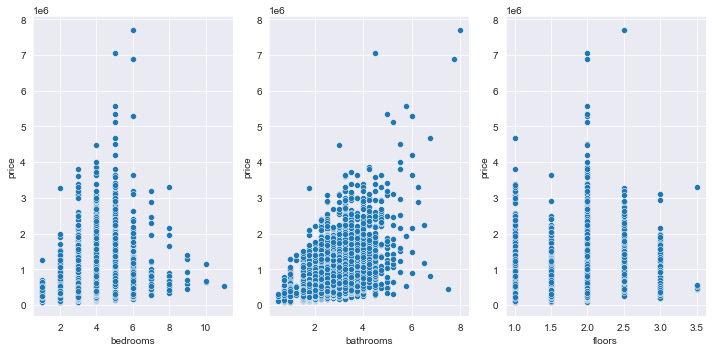

In [21]:
f, ax = plt.subplots(1,3, figsize=(10,5))
sns.scatterplot(data=df, x='bedrooms', y='price', ax=ax[0])
sns.scatterplot(data=df, x='bathrooms', y='price', ax=ax[1])
sns.scatterplot(data=df, x='floors', y='price', ax=ax[2])
plt.tight_layout()

In [146]:
pipeline2 = make_pipeline(
    # Fill missing data
    # impute
    StandardScaler(),
    PolynomialFeatures(degree=2, include_bias=True),
    LinearRegression()   
)
model2 = pipeline2.fit(X_train, y_train)

# Predict response 
y_pred2 = pipeline2.predict(X_test)

get_metrics(y_test, y_pred2)

Mean absolute error = 98276.86
Mean squared error = 23228400071.19
Median absolute error = 67909.03
Explain variance score = 0.83
R2 score = 0.83


In [147]:
# Make a prediction with CV

scores2 = cross_val_score(model2, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores2 = np.sqrt(-scores)
rmse_scores2
# scores.mean(), scores.std()

array([205766.61066495, 196890.11345714, 204050.98885613, 206777.59859617,
       193726.37345544])

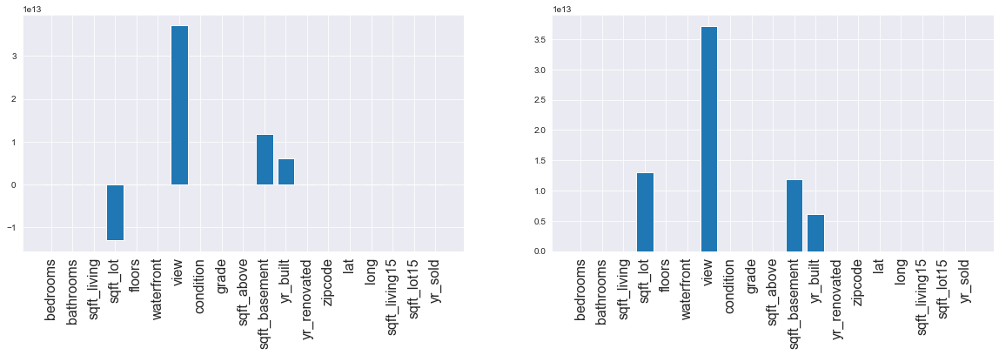

In [148]:
feature_importance(model2[2].coef_, features)

In [151]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
# scaler = StandardScaler()
# scaler.fit(X_train)

# X_train_scaled = scaler.transform(X_train)
# X_test_scaled = scaler.transform(X_test)
poly_features = PolynomialFeatures(degree=2)
Xp = poly_features.fit_transform(X_train_scaled)

X_int2 = sm.add_constant(Xp)
model = sm.OLS(y_train, X_int2).fit()
# model.summary()

### Feature Engineering

In [217]:
df['age_built'] = 2020 - df['yr_built']
df['age_renovated'] = df['yr_renovated'].apply(lambda x: 1 if x!= 0 else 0)
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,age_built,age_renovated
0,7129300520,10/13/2014,12.309982,3,1.00,1180,5650,1.0,0.0,0.0,...,1955,0.0,98178,47.5112,-122.257,1340,5650,2014,65,0
1,6414100192,12/9/2014,13.195614,3,2.25,2570,7242,2.0,0.0,0.0,...,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014,69,1
2,5631500400,2/25/2015,12.100712,2,1.00,770,10000,1.0,0.0,0.0,...,1933,0.0,98028,47.7379,-122.233,2720,8062,2015,87,0
3,2487200875,12/9/2014,13.311329,4,3.00,1960,5000,1.0,0.0,0.0,...,1965,0.0,98136,47.5208,-122.393,1360,5000,2014,55,0
4,1954400510,2/18/2015,13.142166,3,2.00,1680,8080,1.0,0.0,0.0,...,1987,0.0,98074,47.6168,-122.045,1800,7503,2015,33,0


In [159]:
columns_to_drop = ['id', 'date', 'price', 'yr_built', 'yr_renovated']

In [160]:
X_train, X_test, y_train, y_test, features = create_train_test(df, columns_to_drop)

In [161]:
model3 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred3 = pipeline.predict(X_test)

get_metrics(y_test, y_pred3)


# Make a prediction with CV
scores = cross_val_score(model3, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 125719.2
Mean squared error = 40005047687.56
Median absolute error = 89147.96
Explain variance score = 0.71
R2 score = 0.71

RMSE scores: [205768.99741434 196892.5651003  204058.43903163 206781.08950105
 193732.38852473]


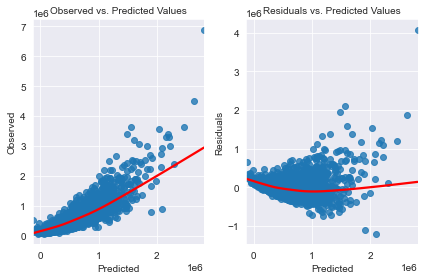

In [162]:
test_linearity(model3, X_test, y_test)

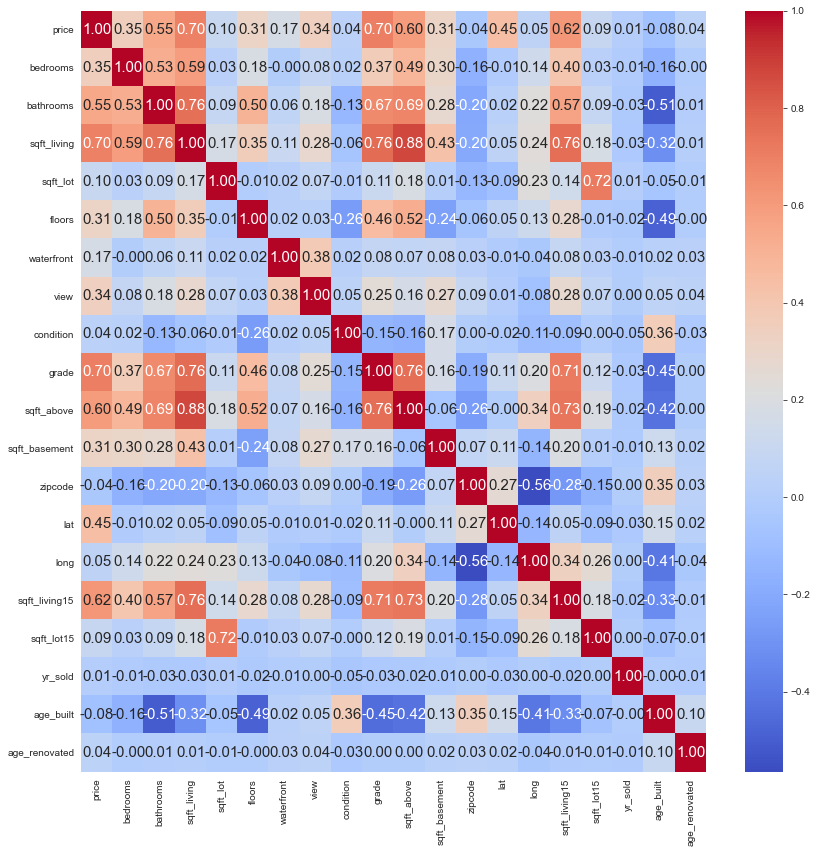

In [73]:
# Create a correlation table
df2 = df.drop(columns = ['id', 'date', 'yr_built', 'yr_renovated'])
corr = df2.corr()
plt.figure(figsize=(14,14))
sns.heatmap(corr, annot=True, fmt = '.2f', annot_kws={'size':15}, cmap='coolwarm')
plt.show();
# print(corr)

In [74]:
corr_features=[]
for i, r in df2.corr().iterrows():
    k = 0
    for j in range(len(r)):
        if i != r.index[k]:
            if r.values[k] >= 0.6:
                corr_features.append([i, r.index[k], r.values[k]])
            k += 1
# corr_features

We can see 'sqft_above' and 'sqft_living' have the highest correlation of 0.87.
In the next model, we will try to drop some of the highly correlated features and see how the model performs.


In [189]:
columns_to_drop = ['id', 'date', 'price', 'yr_built', 'yr_renovated', 
                    'sqft_above', 'yr_sold', 'sqft_lot', 
                   'sqft_lot15',  'sqft_living15', 'condition']

In [190]:
df.drop(columns = columns_to_drop).head()

,bedrooms,bathrooms,sqft_living,floors,waterfront,view,grade,sqft_basement,zipcode,lat,long,age_built,age_renovated
0,3,1.00,1180,1.0,0.0,0.0,7,0.0,98178,47.5112,-122.257,65,0
1,3,2.25,2570,2.0,0.0,0.0,7,400.0,98125,47.7210,-122.319,69,1
2,2,1.00,770,1.0,0.0,0.0,6,0.0,98028,47.7379,-122.233,87,0
3,4,3.00,1960,1.0,0.0,0.0,7,910.0,98136,47.5208,-122.393,55,0
4,3,2.00,1680,1.0,0.0,0.0,8,0.0,98074,47.6168,-122.045,33,0


In [191]:
X_train, X_test, y_train, y_test, features = create_train_test(df, columns_to_drop)

In [192]:
model4 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred4 = pipeline.predict(X_test)

get_metrics(y_test, y_pred4)


# Make a prediction with CV
scores = cross_val_score(model4, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 0.2
Mean squared error = 0.07
Median absolute error = 0.16
Explain variance score = 0.76
R2 score = 0.76

RMSE scores: [0.26018458 0.26341406 0.25697293 0.25273396 0.25783663]


In [193]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model4 = sm.OLS(y_train, X_int).fit()
stats_model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.760
Model:                            OLS   Adj. R-squared:                  0.760
Method:                 Least Squares   F-statistic:                     4201.
Date:                Mon, 08 Mar 2021   Prob (F-statistic):               0.00
Time:                        22:22:45   Log-Likelihood:                -1102.5
No. Observations:               17276   AIC:                             2233.
Df Residuals:                   17262   BIC:                             2342.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.0471      0.002   6646.312      0.000      13.043      13.051
x1            -0.0129      0.003     -5.060      0.000      -0.018      -0.008
x2             0.0576      0.004     16.098      0.000       0.051       0.065
x3             0.1667      0.004     38.141      0.000       0.158       0.175
x4             0.0308      0.003     11.181      0.000       0.025       0.036
x5             0.0288      0.002     13.491      0.000       0.025       0.033
x6             0.0578      0.002     25.225      0.000       0.053       0.062
x7             0.2045      0.003     58.667      0.000       0.198       0.211
x8             0.0010      0.003      0.381      0.704      -0.004       0.006
x9            -0.0454      0.002    -18.158      0.000      -0.050      -0.040
x10            0.1941      0.002     91.618      0.000       0.190       0.198
x11           -0.0140      0.003     -5.456      0.000      -0.019      -0.009
x12            0.1210      0.003     41.995      0.000       0.115       0.127
x13            0.0061      0.002      2.965      0.003       0.002       0.010
==============================================================================
Omnibus:                      302.632   Durbin-Watson:                   2.018
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              620.701
Skew:                          -0.017   Prob(JB):                    1.65e-135
Kurtosis:                       3.928   Cond. No.                         5.32
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

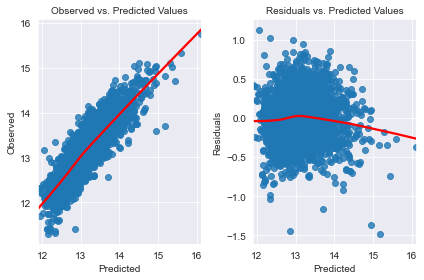

In [194]:
test_linearity(model4, X_test, y_test)

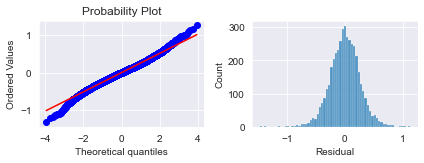

In [195]:
# Normality test
ax1 = plt.subplot(221)
res = stats.probplot(stats_model4.resid, plot=plt)
ax2 = plt.subplot(222)

sns.histplot(y_test - y_pred4)
plt.xlabel('Residual')
plt.tight_layout()
plt.show();

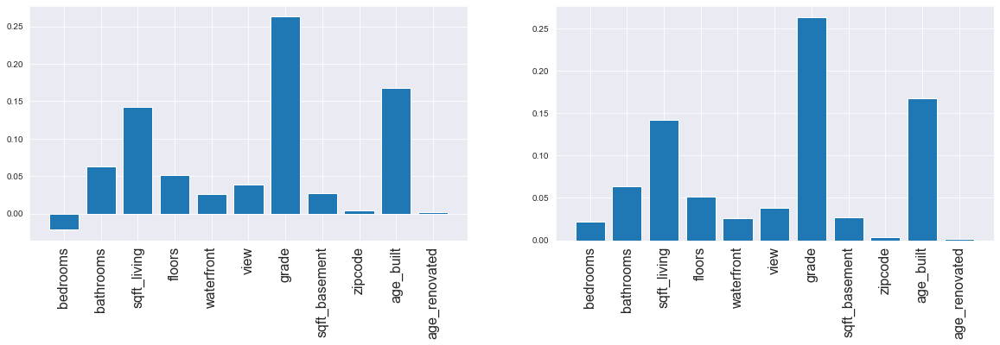

In [37]:
feature_importance(model4[1].coef_, features)

### Preprocess categorical features

In [218]:
df_oh = df.copy(deep=True)
df_oh.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'yr_sold', 'age_built',
       'age_renovated'],
      dtype='object')

In [87]:
# Preprocess categorical features

def floor(x):
    
    if x > 1 and x <= 2:  
        floor = 'Two_floor' 
    elif x >= 3 :
        floor = 'Three_floor'
    else:
        floor = 'One_floor'         
    return floor

def bedroom(x):
    
    if x <= 3:
        room = 'few_bed'
    elif x > 3 and x <= 6:
        room = 'medium_bed'
    else:
        room = 'extra_bed'
    return room


def bathroom(x):
    
    if x <= 1:
        bath = 'one_bath'
    elif x > 1 and x <= 2:
        bath = 'two_bath'
    elif x > 2 and x <= 3:
        bath = 'three_bath'
    elif x > 3 and x <= 4:
        bath = 'four_bath'
    elif x > 4 and x <= 5:
        bath = 'five_bath'
    elif x > 5 and x <= 6:
        bath = 'six_bath'
    elif x > 6 and x <= 7:
        bath = 'seven_bath'
    else:
        bath = 'eight_bath'
    return bath

In [219]:
df_oh['floor_cat'] = df_oh['floors'].apply(floor).astype('category')
df_oh['bedroom_cat'] = df_oh['bedrooms'].apply(bedroom).astype('category')
df_oh['bathroom_cat'] = df_oh['bathrooms'].apply(bathroom).astype('category')

In [220]:
# One hot encoding
categorical_var = ['bedroom_cat', 'bathroom_cat', 'floor_cat']

df_oh = pd.get_dummies(df_oh, columns=(categorical_var), drop_first=True, prefix=None)
df_oh.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,bedroom_cat_medium_bed,bathroom_cat_five_bath,bathroom_cat_four_bath,bathroom_cat_one_bath,bathroom_cat_seven_bath,bathroom_cat_six_bath,bathroom_cat_three_bath,bathroom_cat_two_bath,floor_cat_Three_floor,floor_cat_Two_floor
0,7129300520,10/13/2014,12.309982,3,1.00,1180,5650,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
1,6414100192,12/9/2014,13.195614,3,2.25,2570,7242,2.0,0.0,0.0,...,0,0,0,0,0,0,1,0,0,1
2,5631500400,2/25/2015,12.100712,2,1.00,770,10000,1.0,0.0,0.0,...,0,0,0,1,0,0,0,0,0,0
3,2487200875,12/9/2014,13.311329,4,3.00,1960,5000,1.0,0.0,0.0,...,1,0,0,0,0,0,1,0,0,0
4,1954400510,2/18/2015,13.142166,3,2.00,1680,8080,1.0,0.0,0.0,...,0,0,0,0,0,0,0,1,0,0


In [221]:
df_oh.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'yr_sold', 'age_built',
       'age_renovated', 'bedroom_cat_few_bed', 'bedroom_cat_medium_bed',
       'bathroom_cat_five_bath', 'bathroom_cat_four_bath',
       'bathroom_cat_one_bath', 'bathroom_cat_seven_bath',
       'bathroom_cat_six_bath', 'bathroom_cat_three_bath',
       'bathroom_cat_two_bath', 'floor_cat_Three_floor',
       'floor_cat_Two_floor'],
      dtype='object')

In [224]:
columns_to_drop = ['id', 'date', 'price', 'bedrooms', 'bathrooms', 'floors', 
                   'yr_built', 'yr_renovated', 'sqft_above', 'yr_sold', 'sqft_lot', 
                   'sqft_lot15',  'sqft_living15', 'condition']

In [225]:
X_train, X_test, y_train, y_test, features = create_train_test(df_oh, columns_to_drop)

In [226]:
features

['sqft_living',
 'waterfront',
 'view',
 'grade',
 'sqft_basement',
 'zipcode',
 'lat',
 'long',
 'age_built',
 'age_renovated',
 'bedroom_cat_few_bed',
 'bedroom_cat_medium_bed',
 'bathroom_cat_five_bath',
 'bathroom_cat_four_bath',
 'bathroom_cat_one_bath',
 'bathroom_cat_seven_bath',
 'bathroom_cat_six_bath',
 'bathroom_cat_three_bath',
 'bathroom_cat_two_bath',
 'floor_cat_Three_floor',
 'floor_cat_Two_floor']

In [227]:
model5 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred5 = pipeline.predict(X_test)

get_metrics(y_test, y_pred5)


# Make a prediction with CV
scores = cross_val_score(model5, X_train, y_train, cv = 5, 
                         scoring="neg_mean_squared_error")
rmse_scores = np.sqrt(-scores)
print('\nRMSE scores:', rmse_scores)
# scores.mean(), scores.std()

Mean absolute error = 0.2
Mean squared error = 0.07
Median absolute error = 0.16
Explain variance score = 0.76
R2 score = 0.76

RMSE scores: [0.25933577 0.26453947 0.25732048 0.25242652 0.25782219]


In [228]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model5 = sm.OLS(y_train, X_int).fit()
stats_model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.760
Model:                            OLS   Adj. R-squared:                  0.760
Method:                 Least Squares   F-statistic:                     2608.
Date:                Mon, 08 Mar 2021   Prob (F-statistic):               0.00
Time:                        22:33:01   Log-Likelihood:                -1080.4
No. Observations:               17276   AIC:                             2205.
Df Residuals:                   17254   BIC:                             2375.
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         13.0471      0.002   6653.297      0.000      13.043      13.051
x1             0.1766      0.004     39.663      0.000       0.168       0.185
x2             0.0296      0.002     13.867      0.000       0.025       0.034
x3             0.0589      0.002     25.688      0.000       0.054       0.063
x4             0.2030      0.003     58.195      0.000       0.196       0.210
x5            -0.0032      0.003     -1.179      0.238      -0.009       0.002
x6            -0.0431      0.002    -17.257      0.000      -0.048      -0.038
x7             0.1947      0.002     91.532      0.000       0.191       0.199
x8            -0.0159      0.003     -6.157      0.000      -0.021      -0.011
x9             0.1193      0.003     40.900      0.000       0.114       0.125
x10            0.0075      0.002      3.692      0.000       0.004       0.012
x11            0.0342      0.019      1.772      0.076      -0.004       0.072
x12            0.0269      0.019      1.404      0.160      -0.011       0.065
x13            0.0620      0.026      2.372      0.018       0.011       0.113
x14            0.1752      0.068      2.567      0.010       0.041       0.309
x15            0.1839      0.101      1.824      0.068      -0.014       0.382
x16            0.0035      0.004      0.803      0.422      -0.005       0.012
x17            0.0256      0.010      2.544      0.011       0.006       0.045
x18            0.3026      0.129      2.345      0.019       0.050       0.555
x19            0.2554      0.119      2.144      0.032       0.022       0.489
x20            0.0153      0.002      6.914      0.000       0.011       0.020
x21            0.0233      0.003      8.883      0.000       0.018       0.028
==============================================================================
Omnibus:                      279.528   Durbin-Watson:                   2.020
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              555.542
Skew:                           0.015   Prob(JB):                    2.32e-121
Kurtosis:                       3.878   Cond. No.                         228.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

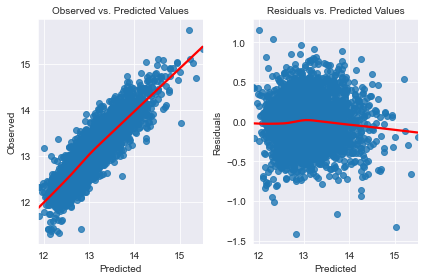

In [229]:
test_linearity(model5, X_test, y_test)

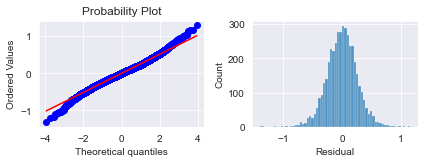

In [230]:
# Normality test
ax1 = plt.subplot(221)
res = stats.probplot(stats_model5.resid, plot=plt)
ax2 = plt.subplot(222)

sns.histplot(y_test - y_pred5)
plt.xlabel('Residual')
plt.tight_layout()
plt.show();

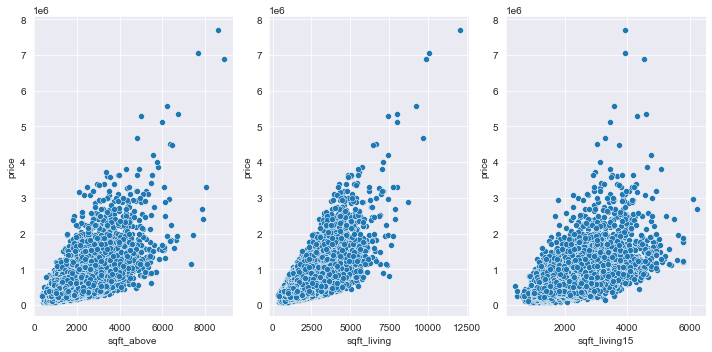

In [99]:
f, ax = plt.subplots(1,3, figsize=(10,5))
sns.scatterplot(data=df, x='sqft_above', y='price', ax=ax[0])
sns.scatterplot(data=df, x='sqft_living', y='price', ax=ax[1])
sns.scatterplot(data=df, x='sqft_living15', y='price', ax=ax[2])
plt.tight_layout()

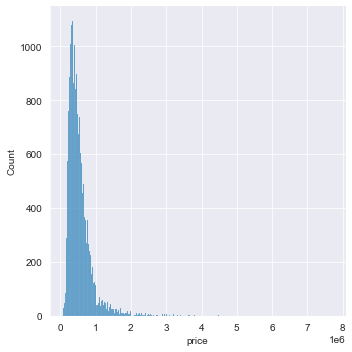

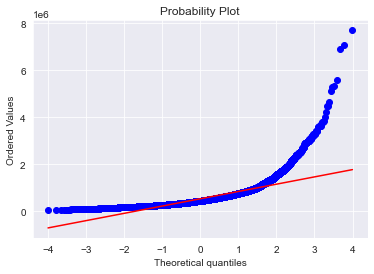

In [20]:
sns.displot(data=df, x='price')
fig = plt.figure()
res = stats.probplot(df['price'], plot=plt)

In [13]:
# Prepare the data for training 
X = df.drop(columns_to_drop, axis=1)
y = df['price']

# Create feature list for feature importance analysis after prediction
features = list(X.columns)

# # Shuffling for randomness
X, y = shuffle(X, y, random_state=42)


# Split into train-test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [14]:
model3 = pipeline.fit(X_train, y_train)

# Predict response 
y_pred = pipeline.predict(X_test)

get_metrics(y_test, y_pred)

Mean absolute error = 0.0
Mean squared error = 0.0
Median absolute error = 0.0
Explain variance score = 1.0
R2 score = 1.0


In [15]:
# Run a statsmodel

# Scale the data: This will included in the pipeline
scaler = StandardScaler()
scaler.fit(X_train)

X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

X_int = sm.add_constant(X_train_scaled)
stats_model = sm.OLS(y_train, X_int).fit()
stats_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.906e+31
Date:                Mon, 08 Mar 2021   Prob (F-statistic):               0.00
Time:                        11:35:34   Log-Likelihood:             3.2813e+05
No. Observations:               17276   AIC:                        -6.562e+05
Df Residuals:                   17257   BIC:                        -6.561e+05
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       5.396e+05   1.04e-11    5.2e+16      0.000     5.4e+05     5.4e+05
x1          3.662e+05   1.76e-11   2.08e+16      0.000    3.66e+05    3.66e+05
x2          1.241e-10   1.37e-11      9.092      0.000    9.74e-11    1.51e-10
x3         -6.003e-11    1.9e-11     -3.151      0.002   -9.74e-11   -2.27e-11
x4          1.819e-11   1.35e-10      0.135      0.893   -2.46e-10    2.83e-10
x5         -3.593e-11   1.51e-11     -2.381      0.017   -6.55e-11   -6.35e-12
x6          3.865e-11   1.47e-11      2.630      0.009    9.85e-12    6.75e-11
x7         -7.367e-11   1.15e-11     -6.391      0.000   -9.63e-11   -5.11e-11
x8          1.546e-10   1.23e-11     12.535      0.000     1.3e-10    1.79e-10
x9          5.554e-11   1.16e-11      4.779      0.000    3.28e-11    7.83e-11
x10         9.959e-11   1.99e-11      5.000      0.000    6.05e-11    1.39e-10
x11         2.383e-10   1.22e-10      1.960      0.050    2.98e-14    4.77e-10
x12         4.911e-11    6.4e-11      0.767      0.443   -7.64e-11    1.75e-10
x13         9.049e-11   1.62e-11      5.589      0.000    5.88e-11    1.22e-10
x14        -2.865e-11    1.1e-11     -2.608      0.009   -5.02e-11   -7.12e-12
x15        -1.633e-10   1.19e-11    -13.712      0.000   -1.87e-10    -1.4e-10
x16         2.303e-10   1.77e-11     13.010      0.000    1.96e-10    2.65e-10
x17         1.473e-10   1.52e-11      9.675      0.000    1.17e-10    1.77e-10
x18        -4.093e-12   1.04e-11     -0.392      0.695   -2.45e-11    1.64e-11
==============================================================================
Omnibus:                     6381.351   Durbin-Watson:                   1.436
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            36886.418
Skew:                          -1.672   Prob(JB):                         0.00
Kurtosis:                       9.329   Cond. No.                         43.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [133]:
# # Preprocessing for numerical data
# numerical_transformer = SimpleImputer(strategy = 'constant')

# # Preprocessing for categorical data
# categorical_transformer = Pipeline(steps = [
#     ('imputer', SimpleImputer(strategy='most_frequent')),
# #     ('onehot', OneHotEncoder(handle_unknown='ignore', sparse=False))
# ])

# preprocessor = ColumnTransformer(
#                     transformers=[
#                         ('num', numerical_transformer, numerical_cols),
#                         ('cat', categorical_transformer, categorical_cols),                        
#                         ('drop_columns', 'drop', columns_to_drop),
#                         ('scale_data', StandardScaler())
#                     ])

In [138]:
# X_train_transformed = preprocessor.fit_transform(X_train)

In [ ]:
model_pipeline = make_pipeline(
    steps=[('pre_processing', preprocessor),
#                                  PolynomialFeatures(degree=3, include_bias=True)
                                 ('model', LinearRegression())
#                                  ])

In [139]:
# # fit the pipeline with the training data
# Baseline_model = model_pipeline.fit(X_train,y_train)

# # predict target values on the training data
# y_pred = model_pipeline.predict(X_test)

# # Evaluate the model
# print("Mean absolute error =", round(metrics.mean_absolute_error(y_test, y_pred), 2)) 
# print("Mean squared error =", round(metrics.mean_squared_error(y_test, y_pred), 2)) 
# print("Median absolute error =", round(metrics.median_absolute_error(y_test, y_pred), 2)) 
# print("Explain variance score =", round(metrics.explained_variance_score(y_test, y_pred), 2)) 
# print("R2 score =", round(metrics.r2_score(y_test, y_pred), 2))

## Further Exploration

### Some Geographical Data Visualization

In [30]:
# # get df of house locations and the lat long
locations_df = df[['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'yr_sold']]

In [31]:
locations_df['condition_str'] = locations_df['condition'].astype(str)

<ipython-input-31-2dd8a86f466d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  locations_df['condition_str'] = locations_df['condition'].astype(str)


In [47]:
def location_map(df, color, title):
    fig = px.scatter_mapbox(df, lat="lat", lon="long",
                            #size = 'price',
                            color = color,                               
                            size_max = 20,
                            zoom=8, 
                            height=500,
                            title = title,
                            mapbox_style="open-street-map",
                            hover_data={'zipcode': True,
                                        'lat': False,
                                        'long': False,
                                        'price': True,
                                        'yr_built': True,
                                        }
                            )
    # fig.update_layout(mapbox_style="open-street-map")
    # fig.update_layout(margin={"r":10,"t":10,"l":50,"b":0})
    fig.show()

In [42]:
def location_map(df, color, title):
    fig = px.scatter_mapbox(df, lat="lat", lon="long",
                            #size = 'price',
                            color = color,                               
                            size_max = 20,
                            zoom=8, 
                            height=500,
                            title = title,
                            hover_data={'zipcode': True,
                                        'lat': False,
                                        'long': False,
                                        'price': True,
                                        'yr_built': True,
                                        }
                            )
    fig.update_layout(mapbox_style="open-street-map")
    # fig.update_layout(margin={"r":10,"t":10,"l":50,"b":0})
    fig.show()

In [48]:
location_map(locations_df, 'price', title = "Housing location with Price")

In [37]:
location_map(locations_df, 'condition_str', title = "Housing location with condition")

In [ ]:
pipeline = Pipeline(steps)

### Prep 1

In [79]:
# Prepare the data for training 
X = df.drop(columns_to_drop, axis=1)
y = df['price']

# Create feature list for feature importance analysis after prediction
features = list(X.columns)

# Shuffling for randomness
X, y = shuffle(X, y, random_state=42)

# Scale the data
scaler = StandardScaler()
X = scaler.fit_transform(X)


# Split into train-test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
# Preprocessing for numerical data
# numerical_transformer = SimpleImputer(strategy = 'constant')

# # Preprocessing for categorical data
# categorical_transformer = Pipeline(steps = [
#     ('imputer', SimpleImputer(strategy='most_frequent')),
#     ('onehot', One)
# ])

preprocessor = ColumnTransformer(
                    transformers=[('drop_columns', 'drop', ['id', 
                                                            'date',
                                                            'price',
                                                            'lat', 
                                                            'long'
                                                            ]),
                                  ('scale_data', StandardScaler())

In [ ]:
# Define the Pipeline

model_pipeline = Pipeline(steps=[('pre_processing',preprocessor),
                                 ('model', LinearRegression())
                                 ])

# fit the pipeline with the training data
Baseline_model = model_pipeline.fit(X_train,y_train)

# predict target values on the training data
y_pred = model_pipeline.predict(X_test)

# Evaluate the model
print("Mean absolute error =", round(metrics.mean_absolute_error(y_test, y_pred), 2)) 
print("Mean squared error =", round(metrics.mean_squared_error(y_test, y_pred), 2)) 
print("Median absolute error =", round(metrics.median_absolute_error(y_test, y_pred), 2)) 
print("Explain variance score =", round(metrics.explained_variance_score(y_test, y_pred), 2)) 
print("R2 score =", round(metrics.r2_score(y_test, y_pred), 2))

### Baseline

In [80]:
baseline_model = make_pipeline(
    # Fill missing data
    # impute
    # one hote encoding
    LinearRegression()   
)
baseline_model.fit(X_train, y_train)

# Predict response 
y_pred = baseline_model.predict(X_test)

print("Mean absolute error =", round(metrics.mean_absolute_error(y_test, y_pred), 2)) 
print("Mean squared error =", round(metrics.mean_squared_error(y_test, y_pred), 2)) 
print("Median absolute error =", round(metrics.median_absolute_error(y_test, y_pred), 2)) 
print("Explain variance score =", round(metrics.explained_variance_score(y_test, y_pred), 2)) 
print("R2 score =", round(metrics.r2_score(y_test, y_pred), 2))

Mean absolute error = 139413.59
Mean squared error = 44003824460.46
Median absolute error = 101480.92
Explain variance score = 0.67
R2 score = 0.67


### Pipelines1

In [81]:
model1 = make_pipeline(
    # Fill missing data
    # impute
    # one hote encoding
    LinearRegression()   
)
model1.fit(X_train, y_train)

# Predict response 
y_pred = model1.predict(X_test)

print("Mean absolute error =", round(metrics.mean_absolute_error(y_test, y_pred), 2)) 
print("Mean squared error =", round(metrics.mean_squared_error(y_test, y_pred), 2)) 
print("Median absolute error =", round(metrics.median_absolute_error(y_test, y_pred), 2)) 
print("Explain variance score =", round(metrics.explained_variance_score(y_test, y_pred), 2)) 
print("R2 score =", round(metrics.r2_score(y_test, y_pred), 2))

### Pipeline2

In [96]:
model2 = make_pipeline(
    # Fill missing data
    # impute
    # one hote encoding
    LinearRegression()   
)
model2.fit(X_train, y_train)

# Predict response 
y_pred = model2.predict(X_test)

print("Mean absolute error =", round(metrics.mean_absolute_error(y_test, y_pred), 2)) 
print("Mean squared error =", round(metrics.mean_squared_error(y_test, y_pred), 2)) 
print("Median absolute error =", round(metrics.median_absolute_error(y_test, y_pred), 2)) 
print("Explain variance score =", round(metrics.explained_variance_score(y_test, y_pred), 2)) 
print("R2 score =", round(metrics.r2_score(y_test, y_pred), 2))

Mean absolute error = 139413.59
Mean squared error = 44003824460.46
Median absolute error = 101480.92
Explain variance score = 0.67
R2 score = 0.67


### Pipeline3


In [106]:
model3 = make_pipeline(
    # Fill missing data
    # impute
    # one hote encoding
    LinearRegression()   
)
model3.fit(X_train, y_train)

# Predict response 
y_pred = model3.predict(X_test)

print("Mean absolute error =", round(metrics.mean_absolute_error(y_test, y_pred), 2)) 
print("Mean squared error =", round(metrics.mean_squared_error(y_test, y_pred), 2)) 
print("Median absolute error =", round(metrics.median_absolute_error(y_test, y_pred), 2)) 
print("Explain variance score =", round(metrics.explained_variance_score(y_test, y_pred), 2)) 
print("R2 score =", round(metrics.r2_score(y_test, y_pred), 2))

Mean absolute error = 139419.9
Mean squared error = 43995251185.23
Median absolute error = 101306.54
Explain variance score = 0.67
R2 score = 0.67


In [57]:
def feature_importance(model, features):
    '''
    Create feature comparison graphs
    
    '''

    temp1 = dict(zip(features, model[0].coef_))
    temp2 = dict(zip(features, abs(model[0].coef_)))

    
    fig, ax = plt.subplots(1,2, figsize=(20,5))    
    
    ax[0].bar(range(len(temp1)), list(temp1.values()), align='center')
    ax[0].set_xticks(range(len(temp1))) 
    ax[0].set_xticklabels(labels = list(temp1.keys()), rotation='vertical', fontsize=16);    

    ax[1].bar(range(len(temp2)), list(temp2.values()), align='center')
    ax[1].set_xticks(range(len(temp2))) 
    ax[1].set_xticklabels(labels = list(temp2.keys()), rotation='vertical', fontsize=16);    


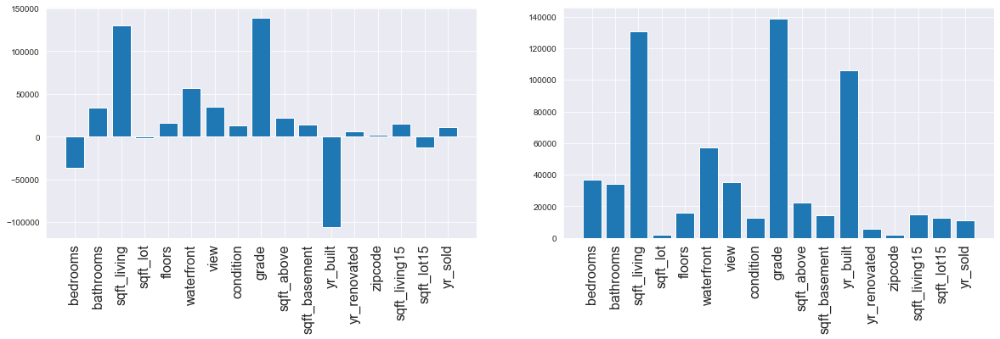

In [45]:
feature_importance(Baseline_model, features)

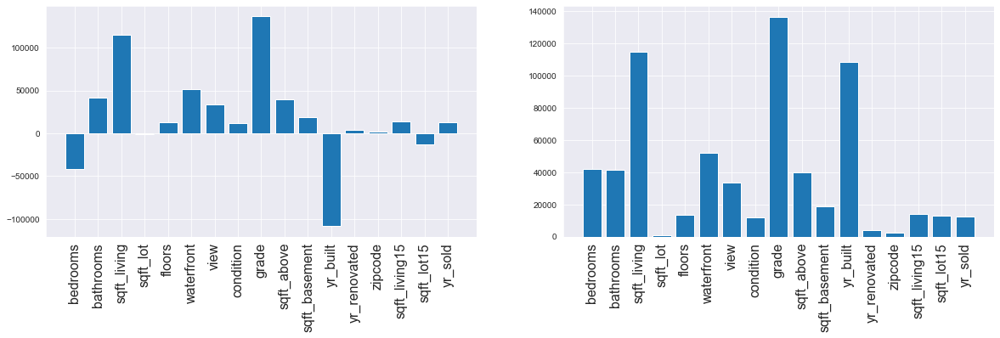

In [85]:
feature_importance(model1, features)

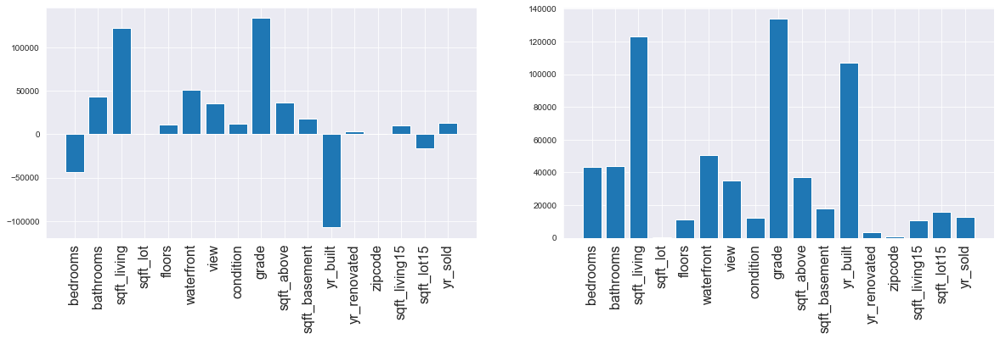

In [97]:
feature_importance(model2, features)

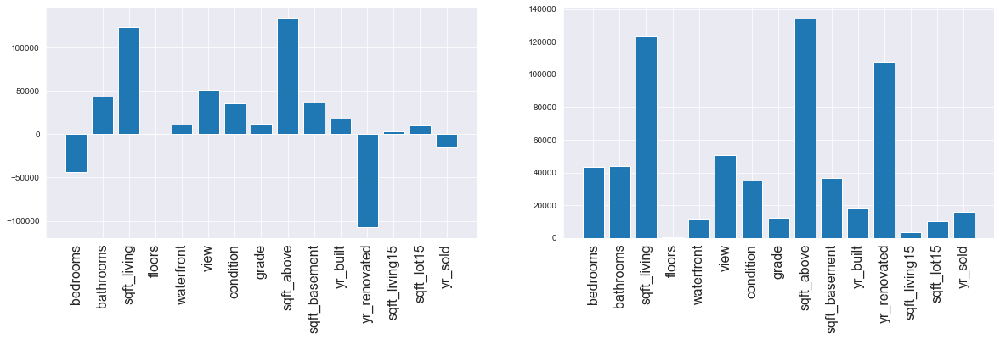

In [107]:
feature_importance(model2, features)

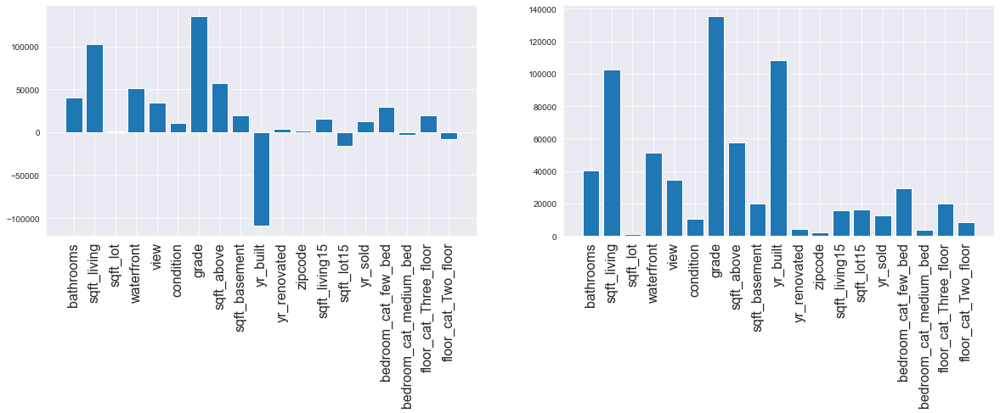

In [66]:
feature_importance(model4, features)

### Let's explore the data more

In [109]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000,2014
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503,2015
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,3890,1530.0,2001,0.0,98053,47.6561,-122.005,4760,101930,2014
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,1715,0.0,1995,0.0,98003,47.3097,-122.327,2238,6819,2014


In [108]:
categorical = ['bedrooms', 'bathrooms', 'floors', 'waterfront', 'view', 'condition',
           'grade']
for col in categorical:
    print(col,':', df[col].unique())

bedrooms : [ 3  4  2  5  1  6  7  8  9 11 10]
bathrooms : [2.25 3.   2.   4.5  1.   2.5  1.75 2.75 1.5  3.25 4.   3.5  0.75 5.
 4.25 3.75 1.25 5.25 4.75 0.5  5.5  6.   5.75 8.   6.75 7.5  7.75]
floors : [2.  1.  1.5 3.  2.5 3.5]
waterfront : [0. 1.]
view : [0. 3. 4. 2. 1.]
condition : [3 5 4 1 2]
grade : [ 7  8 11  9  6  5 10 12  4  3 13]


The categories like 'grade', 'condition', and 'view' are in naturally increasing order, so we will leave them as numerical for now. 
The increase in no. of 'bathrooms' although may not necessarily correlated to price, but we will leave this feature to be numeric as there are too many categories under this feature.

### Preprocess Categorical


In [58]:
# Preprocess categorical features

def floor(x):
    
    if x > 1 and x <= 2:  
        floor = 'Two_floor' 
    elif x >= 3 :
        floor = 'Three_floor'
    else:
        floor = 'One_floor'         
    return floor

def bedroom(x):
    
    if x <= 3:
        room = 'few_bed'
    elif x > 3 and x <= 6:
        room = 'medium_bed'
    else:
        room = 'extra_bed'
    return room


def bathroom(x):
    
    if x <= 1:
        bath = 'one_bath'
    elif x > 1 and x <= 2:
        bath = 'two_bath'
    elif x > 2 and x <= 3:
        bath = 'three_bath'
    elif x > 3 and x <= 4:
        bath = 'four_bath'
    elif x > 4 and x <= 5:
        bath = 'five_bath'
    elif x > 5 and x <= 6:
        bath = 'six_bath'
    elif x > 6 and x <= 7:
        bath = 'seven_bath'
    else:
        bath = 'eight_bath'
    return bath

df['floor_cat'] = df['floors'].apply(floor).astype('category')
df['bedroom_cat'] = df['bedrooms'].apply(bedroom).astype('category')
df['bathroom_cat'] = df['bathrooms'].apply(bathroom).astype('category')

In [59]:
df['floor_cat'] = df['floors'].apply(floor).astype('category')

In [60]:
def bedroom(x):
    
    if x <= 3:
        room = 'few_bed'
    elif x > 3 and x <= 6:
        room = 'medium_bed'
    else:
        room = 'extra_bed'
    return room

In [61]:
df['bedroom_cat'] = df['bedrooms'].apply(bedroom).astype('category')

In [13]:
def bathroom(x):
    
    if x <= 1:
        bath = 'one_bath'
    elif x > 1 and x <= 2:
        bath = 'two_bath'
    elif x > 2 and x <= 3:
        bath = 'three_bath'
    elif x > 3 and x <= 4:
        bath = 'four_bath'
    elif x > 4 and x <= 5:
        bath = 'five_bath'
    elif x > 5 and x <= 6:
        bath = 'six_bath'
    elif x > 6 and x <= 7:
        bath = 'seven_bath'
    else:
        bath = 'eight_bath'
    return bath

In [14]:
# df['bathroom_cat'] = df['bathrooms'].apply(bathroom).astype('category')

In [21]:
# df['waterfront_cat'] = df['waterfront'].apply(lambda x: 'wf' if x==1 else 'no_wf').astype('category')

In [62]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,floor_cat,bedroom_cat
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014,Two_floor,few_bed
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,1965,0.0,98136,47.5208,-122.393,1360,5000,2014,One_floor,medium_bed
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,1987,0.0,98074,47.6168,-122.045,1800,7503,2015,One_floor,few_bed
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,2001,0.0,98053,47.6561,-122.005,4760,101930,2014,One_floor,medium_bed
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,1995,0.0,98003,47.3097,-122.327,2238,6819,2014,Two_floor,few_bed


In [63]:
# One hot encoding
categorical_var = ['bedroom_cat', 'floor_cat']

df_oh = pd.get_dummies(df, columns=(categorical_var), drop_first=True, prefix=None)

df_oh.drop(columns=['bedrooms', 'floors'], axis=1, inplace=True)
df_oh.head()

,id,date,price,bathrooms,sqft_living,sqft_lot,waterfront,view,condition,grade,...,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,bedroom_cat_few_bed,bedroom_cat_medium_bed,floor_cat_Three_floor,floor_cat_Two_floor
1,6414100192,12/9/2014,538000.0,2.25,2570,7242,0.0,0.0,3,7,...,98125,47.7210,-122.319,1690,7639,2014,1,0,0,1
3,2487200875,12/9/2014,604000.0,3.00,1960,5000,0.0,0.0,5,7,...,98136,47.5208,-122.393,1360,5000,2014,0,1,0,0
4,1954400510,2/18/2015,510000.0,2.00,1680,8080,0.0,0.0,3,8,...,98074,47.6168,-122.045,1800,7503,2015,1,0,0,0
5,7237550310,5/12/2014,1230000.0,4.50,5420,101930,0.0,0.0,3,11,...,98053,47.6561,-122.005,4760,101930,2014,0,1,0,0
6,1321400060,6/27/2014,257500.0,2.25,1715,6819,0.0,0.0,3,7,...,98003,47.3097,-122.327,2238,6819,2014,1,0,0,1


In [34]:

# # # Apply one-hot encoding to categorical data
# OH_encoder = OneHotEncoder(handle_unknown='ignore')
# X_oh = pd.DataFrame(OH_encoder.fit_transform(X[categorical_var]))

# # Put back index removed after one-hot encoding
# X_oh.index = X.index

# # Remove categorical features after one hot encoding
# X_num  = X.drop(categorical_var, axis=1)

# # Add one-hot encoded columns to the numerical feature
# X_new = pd.concat([X_num, X_oh], axis=1)


### Prep with one hot encoding

In [64]:
# Prepare the data for training 
X = df_oh.drop(columns_to_drop, axis=1)
y = df_oh['price']


# Create feature list for feature importance analysis after prediction
features = list(X.columns)

# Shuffling for randomness
X, y = shuffle(X, y, random_state=42)

# Scale the data
scaler = StandardScaler()
X = scaler.fit_transform(X)


# Split into train-test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


### Pipeline 4

In [65]:
model4 = make_pipeline(
    # Fill missing data
    # impute
    # one hote encoding
    LinearRegression()   
)
model4.fit(X_train, y_train)

# Predict response 
y_pred = model4.predict(X_test)

print("Mean absolute error =", round(metrics.mean_absolute_error(y_test, y_pred), 2)) 
print("Mean squared error =", round(metrics.mean_squared_error(y_test, y_pred), 2)) 
print("Median absolute error =", round(metrics.median_absolute_error(y_test, y_pred), 2)) 
print("Explain variance score =", round(metrics.explained_variance_score(y_test, y_pred), 2)) 
print("R2 score =", round(metrics.r2_score(y_test, y_pred), 2))

Mean absolute error = 140166.66
Mean squared error = 44117249432.67
Median absolute error = 103081.46
Explain variance score = 0.67
R2 score = 0.67


### Run a statsmodel

In [68]:
X = df_oh.drop(columns_to_drop, axis=1)
y = df_oh['price']

In [69]:
X_int = sm.add_constant(X)
model = sm.OLS(y, X_int).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.659
Model:                            OLS   Adj. R-squared:                  0.658
Method:                 Least Squares   F-statistic:                     1598.
Date:                Thu, 04 Mar 2021   Prob (F-statistic):               0.00
Time:                        23:11:53   Log-Likelihood:            -2.1604e+05
No. Observations:               15760   AIC:                         4.321e+05
Df Residuals:                   15740   BIC:                         4.323e+05
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                  -4.757e+07   8.35e+06     -5.700      0.000   -6.39e+07   -3.12e+07
bathrooms               4.736e+04   4064.595     11.653      0.000    3.94e+04    5.53e+04
sqft_living              133.3451     22.979      5.803      0.000      88.304     178.387
sqft_lot                  -0.0350      0.060     -0.585      0.559      -0.152       0.082
waterfront              6.085e+05   2.19e+04     27.729      0.000    5.65e+05    6.51e+05
view                    4.272e+04   2718.905     15.714      0.000    3.74e+04    4.81e+04
condition               1.706e+04   2975.079      5.735      0.000    1.12e+04    2.29e+04
grade                   1.176e+05   2680.177     43.886      0.000    1.12e+05    1.23e+05
sqft_above                48.5305     22.923      2.117      0.034       3.599      93.462
sqft_basement             25.6784     22.751      1.129      0.259     -18.916      70.273
yr_built               -3680.2234     87.542    -42.039      0.000   -3851.816   -3508.631
yr_renovated              12.0728      4.660      2.591      0.010       2.939      21.206
zipcode                   21.4003     37.013      0.578      0.563     -51.149      93.950
sqft_living15             21.9262      4.348      5.042      0.000      13.403      30.450
sqft_lot15                -0.4976      0.090     -5.521      0.000      -0.674      -0.321
yr_sold                 2.571e+04   3717.542      6.916      0.000    1.84e+04     3.3e+04
bedroom_cat_few_bed     2.447e+04   3.44e+04      0.711      0.477    -4.3e+04     9.2e+04
bedroom_cat_medium_bed -4.122e+04   3.41e+04     -1.208      0.227   -1.08e+05    2.57e+04
floor_cat_Three_floor   1.239e+05   1.16e+04     10.663      0.000    1.01e+05    1.47e+05
floor_cat_Two_floor    -1.249e+04   4551.727     -2.744      0.006   -2.14e+04   -3570.243
==============================================================================
Omnibus:                    11939.316   Durbin-Watson:                   1.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           893802.656
Skew:                           3.031   Prob(JB):                         0.00
Kurtosis:                      39.392   Cond. No.                     4.85e+08
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.85e+08. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

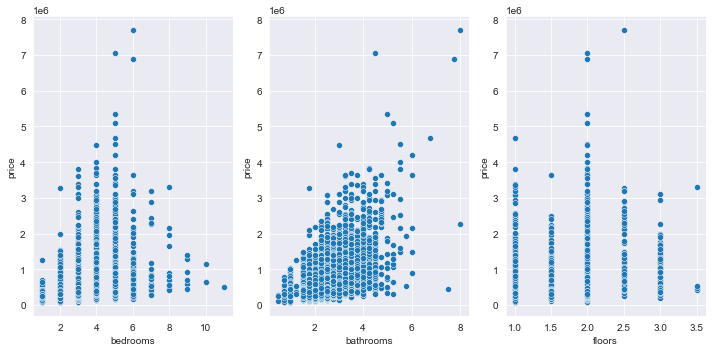

In [78]:
f, ax = plt.subplots(1,3, figsize=(10,5))
sns.scatterplot(data=df, x='bedrooms', y='price', ax=ax[0])
sns.scatterplot(data=df, x='bathrooms', y='price', ax=ax[1])
sns.scatterplot(data=df, x='floors', y='price', ax=ax[2])
plt.tight_layout()

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

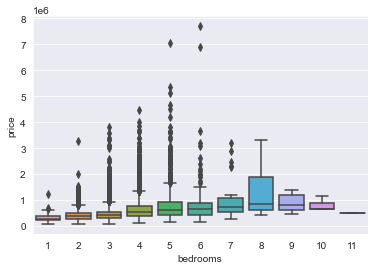

In [54]:
sns.boxplot(data=df, x='bedrooms', y='price')

In [79]:
# Prepare the data for training 
X = df.drop(columns_to_dop, axis=1)
y = df['price']

# Create feature list for feature importance analysis after prediction
features = list(X.columns)

# Shuffling for randomness
X, y = shuffle(X, y, random_state=42)

# Scale the data
scaler = StandardScaler()
X = scaler.fit_transform(X)


# Split into train-test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [80]:
Model1 = make_pipeline(
    # Fill missing data
    # impute
    # one hote encoding
    LinearRegression()   
)

Baseline_model.fit(X_train, y_train)
# Predict response 
y_pred = Baseline_model.predict(X_test)

In [ ]:
Model2 = make_pipeline(
    # Fill missing data
    # impute
    # one hote encoding
    LinearRegression()   
)

Baseline_model.fit(X_train, y_train)
# Predict response 
y_pred = Baseline_model.predict(X_test)

In [24]:
plot_data = df.drop(columns = ['id', 'date', 'lat', 'long' ])
plot_data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,yr_sold
1,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,1690,7639,2014
3,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,1360,5000,2014
4,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,1800,7503,2015
5,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,4760,101930,2014
6,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,0.0,1995,0.0,98003,2238,6819,2014


In [25]:
plot_data.head()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,sqft_living15,sqft_lot15,yr_sold
1,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,3,7,2170,400.0,1951,1991.0,98125,1690,7639,2014
3,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,5,7,1050,910.0,1965,0.0,98136,1360,5000,2014
4,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,3,8,1680,0.0,1987,0.0,98074,1800,7503,2015
5,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,3,11,3890,1530.0,2001,0.0,98053,4760,101930,2014
6,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,3,7,1715,0.0,1995,0.0,98003,2238,6819,2014


In [ ]:
sns.scatterplot(data=plot_data, x='bedrooms', y='price')

<AxesSubplot:xlabel='bedrooms', ylabel='price'>

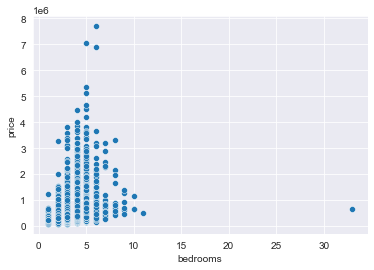

In [93]:
sns.scatterplot(data=plot_data, x='bedrooms', y='price')

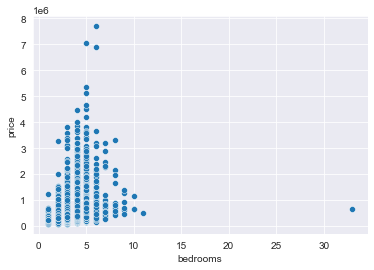

In [98]:
ax = sns.scatterplot(data=plot_data, x='bedrooms', y='price')
                 

<AxesSubplot:xlabel='bathrooms', ylabel='price'>

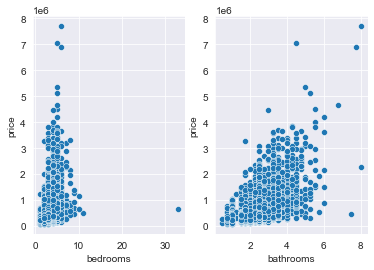

In [37]:
f, ax = plt.subplots(1,2)
sns.scatterplot(data=plot_data, x='bedrooms', y='price', ax=ax[0])
sns.scatterplot(data=plot_data, x='bathrooms', y='price', ax=ax[1])

<AxesSubplot:xlabel='yr_sold', ylabel='price'>

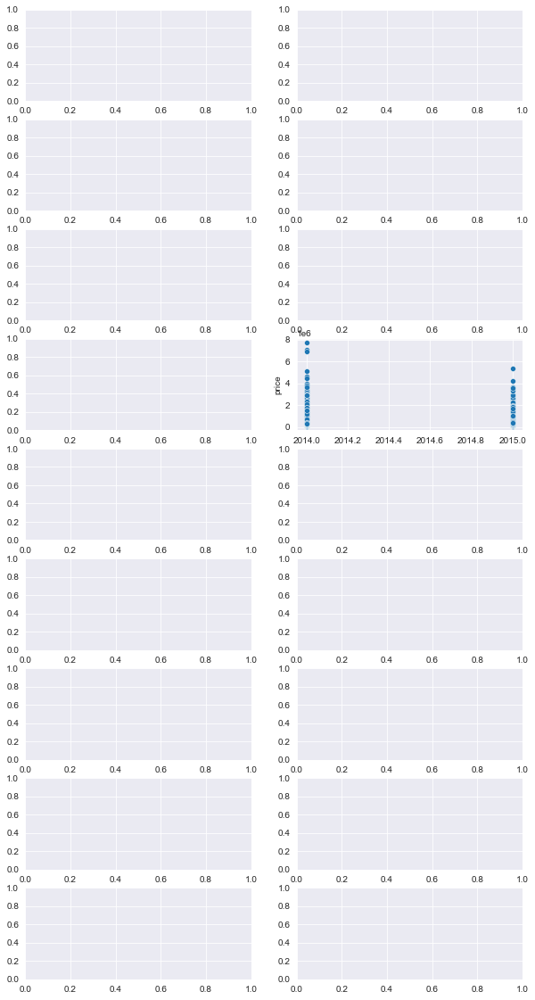

In [38]:
f, axes = plt.subplots(9,2,figsize=(10,20))
r = 2
c = 1
axes[r][c]

sns.scatterplot(data=plot_data, x='yr_sold', y='price', ax=axes[3][1])

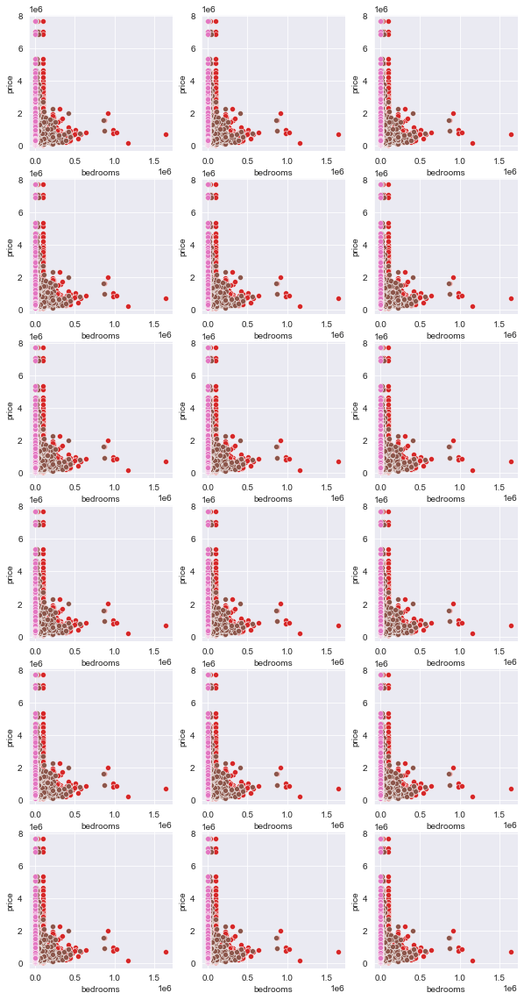

In [32]:
f, ax = plt.subplots(6,3,figsize=(10,20))
# r = 2
# c = 1
# axes[r][c]

for r in range(6):
    for c in range(3):
        for col in plot_data.iloc[:,1:].columns:
            sns.scatterplot(data=plot_data, x=col, y='price', ax=ax[r][c])

<ipython-input-33-03f2dcf51a71>:11: UserWarning:

Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations



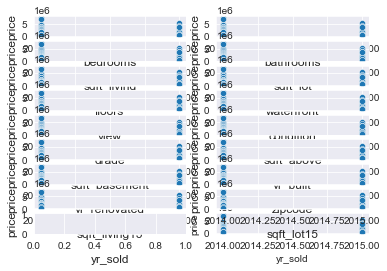

In [33]:
f, axes = plt.subplots(9,2)

for idx, col in enumerate(plot_data.iloc[:,1:].columns):    

    sns.scatterplot(data=plot_data, x='yr_sold', y='price')
    plt.subplot(9, 2, idx+1)
#     c = c + 1
    
    plt.xlabel(col, size=12)
    plt.ylabel('price', size=12)
plt.tight_layout()
plt.show();

In [52]:
def decade(x):
    
    min = 1900
    
    if x - min < 9: 
        decade = min
    elif x - min >= 10 and x - min < 19:
        decade = min+10
    elif x - min >= 20 and x - min < 29:
        decade = min+20
    elif x - min >= 30 and x - min < 39:
        decade = min+30
    elif x - min >= 40 and x - min < 49:
        decade = min+40
    elif x - min >= 50 and x - min < 59:
        decade = min+50
    elif x - min >= 60 and x - min < 69:
        decade = min+60
    elif x - min >= 70 and x - min < 79:
        decade = min+70
    elif x - min >= 80 and x - min < 89:
        decade = min+80
    elif x - min >= 90 and x - min < 99:
        decade = min+90
    elif x - min >= 100 and x - min < 109:
        decade = min+100
    else:
        decade = min+110
    return decade

In [55]:
df['decade_built'] = df['yr_built'].apply(decade)

In [56]:
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,yr_sold,decade,decade_built
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,1951,1991.0,98125,47.7210,-122.319,1690,7639,2014,1990,1950
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,1965,0.0,98136,47.5208,-122.393,1360,5000,2014,1990,1960
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,1987,0.0,98074,47.6168,-122.045,1800,7503,2015,1990,1980
5,7237550310,5/12/2014,1230000.0,4,4.50,5420,101930,1.0,0.0,0.0,...,2001,0.0,98053,47.6561,-122.005,4760,101930,2014,2000,2000
6,1321400060,6/27/2014,257500.0,3,2.25,1715,6819,2.0,0.0,0.0,...,1995,0.0,98003,47.3097,-122.327,2238,6819,2014,1990,1990


In [57]:
df.yr_renovated.unique()

array([1991.,    0., 2002., 2010., 1992., 2013., 1994., 1978., 2005.,
       2003., 1984., 1954., 2014., 2011., 1983., 1990., 1988., 1977.,
       1981., 1995., 2000., 1999., 1998., 1970., 1989., 2004., 1986.,
       2007., 1987., 2006., 1985., 2001., 1980., 1971., 1945., 1979.,
       1997., 1950., 1969., 1948., 2009., 2015., 2008., 2012., 1968.,
       1963., 1951., 1962., 1953., 1993., 1955., 1996., 1982., 1956.,
       1940., 1976., 1946., 1975., 1964., 1973., 1957., 1959., 1960.,
       1965., 1967., 1934., 1972., 1944., 1958., 1974.])

In [413]:
y = 0
for i in range(df.yr_built.min(), df.yr_built.max(), 1):
    if (i - df.yr_built.min()) < 9:
        decade = df.yr_built.min() +  y
        y += 10        
        print(decade)


1900
1910
1920
1930
1940
1950
1960
1970
1980


In [402]:
range(df.yr_built.min(), df.yr_built.max(),1)

range(1900, 2015)

In [403]:
range(5)

range(0, 5)